In [24]:
import tensorflow as tf
import numpy as np
import os,sys, random, cv2

In [25]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

from tensorflow.python.client import device_lib

In [26]:
#import pywt
import ops
from ops import load_image, data_augmentation
import helpers
import utils_
from utils_ import get_model

In [27]:
gpu = '-1'
os.environ['CUDA_VISIBLE_DEVICES'] = gpu

In [28]:
# Enter checkpoint folder to load weights
cwd = os.getcwd()
#checkpoint = cwd + '/checkpoint_fusion_Seoul_NGI'
gpus = '0'#ops.check_available_gpus()
n_gpu = gpu

In [29]:
tf.reset_default_graph()
config = tf.ConfigProto()
## For multiple gpu
config.gpu_options.allow_growth = True
sess = tf.Session(config=config)

In [30]:
dataset = 'lashan'
model = 'aunet'
# Checkpoint where your weights are
checkpoint = '/media/HDD_4T/Documents/cesar-workspace/checkpoint_attention'#cwd + '/checkpoints_SHARP_FUSION2'
n_classes = 2
input = tf.placeholder(tf.float32, shape=[None, None, None, 3], name='input')
output = tf.placeholder(tf.float32, shape=[None, None, None, n_classes])

In [31]:
keep_prob = tf.placeholder(tf.float32)
input_A = tf.split(input, len(gpus))
outpu_A = tf.split(input, len(gpus))


In [32]:
init_fn = None

In [33]:
network = get_model(model, input, n_classes, keep_prob, gpu)

In [34]:
if n_gpu == '-1':
    network = get_model(model, input, n_classes, keep_prob, gpu)
else:
    for gpu_id in range(len(gpus)):
                with tf.device(tf.DeviceSpec(device_type='GPU', device_index=gpu_id)):
                    with tf.variable_scope(tf.get_variable_scope(), reuse=(gpu_id > 0)):
                        network = get_model(model, input_A[gpu_id], n_classes, keep_prob, gpu)

In [35]:
saver=tf.train.Saver(max_to_keep=1000)
sess.run(tf.global_variables_initializer())

utils_.count_params()

This model has 155791756 trainable parameters


In [36]:
if init_fn is not None:
    init_fn(sess)
    

#save_predictions = cwd + ''

In [37]:
model_checkpoint_name = checkpoint +"/latest_model_" + model + "_" + 'cesar_roads'+ ".ckpt"
print('Loaded latest model checkpoint')
saver.restore(sess, model_checkpoint_name)

Loaded latest model checkpoint
INFO:tensorflow:Restoring parameters from /media/HDD_4T/Documents/cesar-workspace/checkpoint_attention/latest_model_aunet_cesar_roads.ckpt


In [38]:
# target folder for prediction
label_values = [[0, 255, 0], [0, 0, 0]]
predict_dir = 'lashan'
target = cwd + '/' + predict_dir + '/' + 'train' 
target_labels = target + '_labels'

In [39]:
def load_dataset(path):
    names = []
    for name in os.listdir(path):
        names.append(name)
    names.sort()
    return names

def loadImage(file):
    img = cv2.cvtColor(cv2.imread(file, -1), cv2.COLOR_BGR2RGB)
    return img

def one_hot_to_it(label, label_values):
    """
    Convert a segmentation image label array to one-hot format
    by replacing each pixel value with a vector of length num_classes

    # Arguments
        label: The 2D array segmentation image label
        label_values

    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of num_classes
    """
    
    semantic_map = []
    for colour in label_values:
        # colour_map = np.full((label.shape[0], label.shape[1], label.shape[2]), colour, dtype=int)
        equality = np.equal(label, colour)
        class_map = np.all(equality, axis = -1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)
    # print("Time 2 = ", time.time() - st)

    return semantic_map
    
def reverse_one_hot(image):
    x = np.argmax(image, axis = -1)
    return x

In [40]:
import helpers
data = load_dataset(target)

In [41]:
from IPython.display import Image
from matplotlib import pyplot as plt


/home/beemap/miniconda2/envs/cesar/lib/python2.7/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


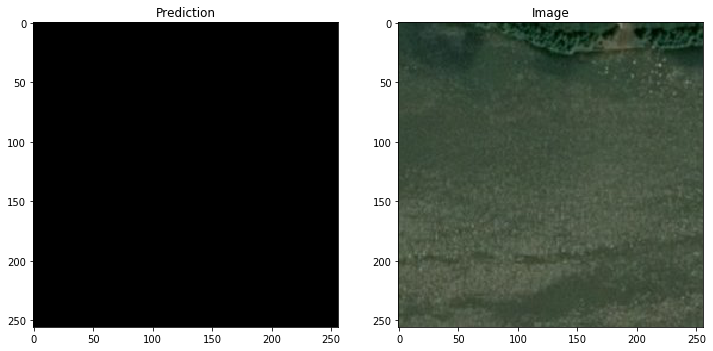

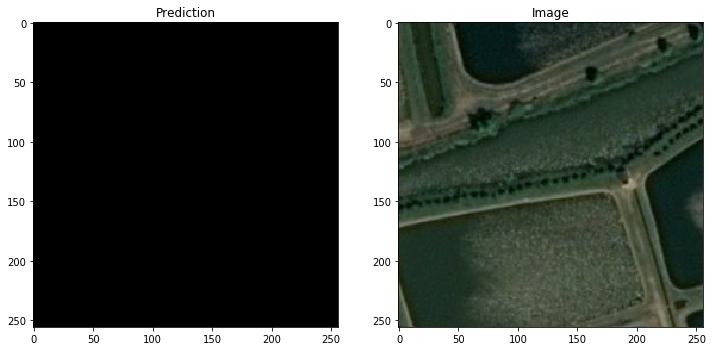

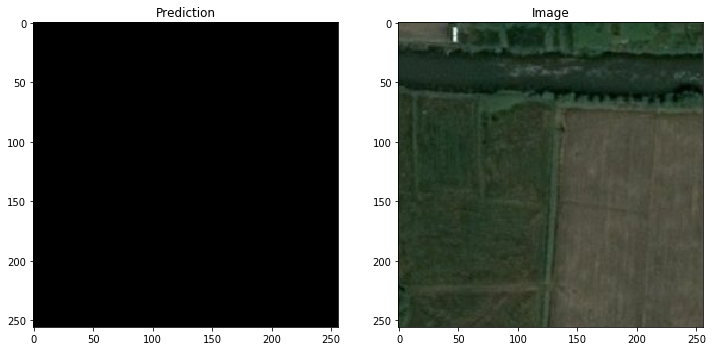

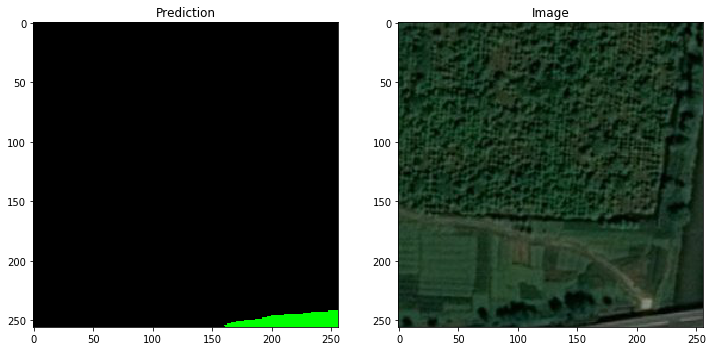

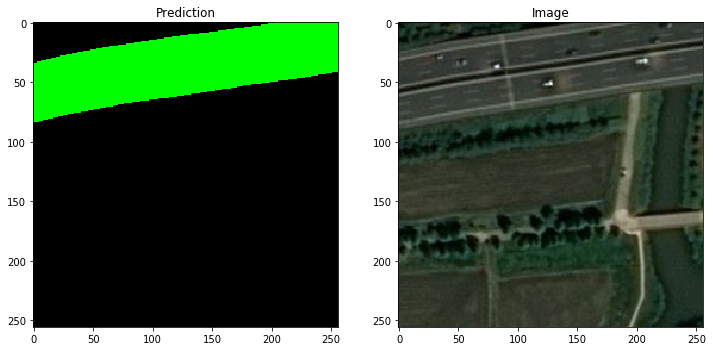

...

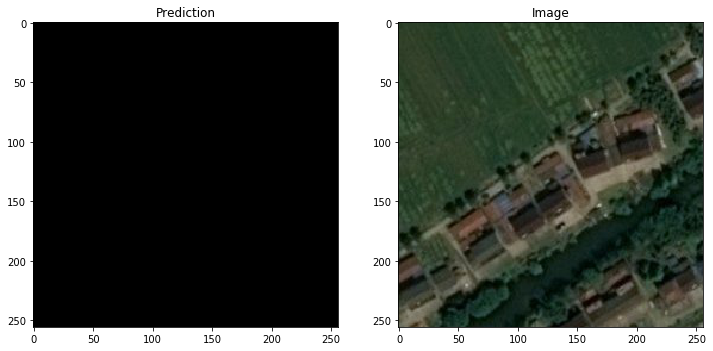

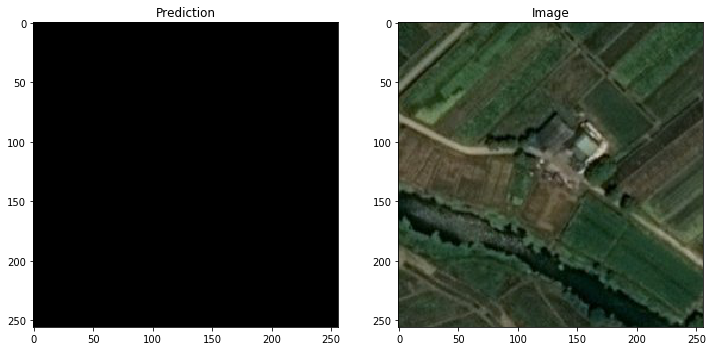

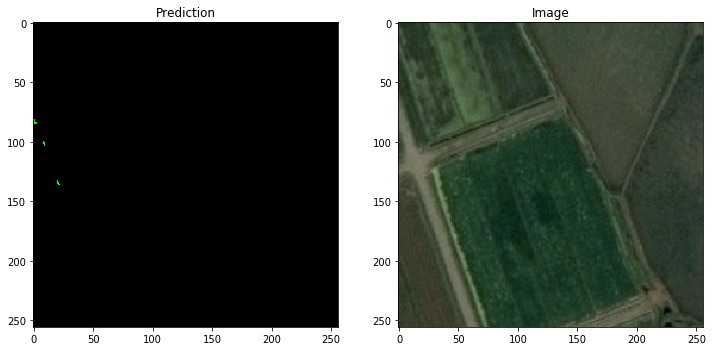

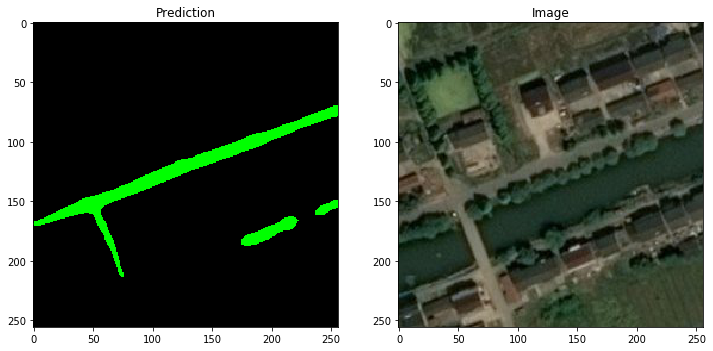

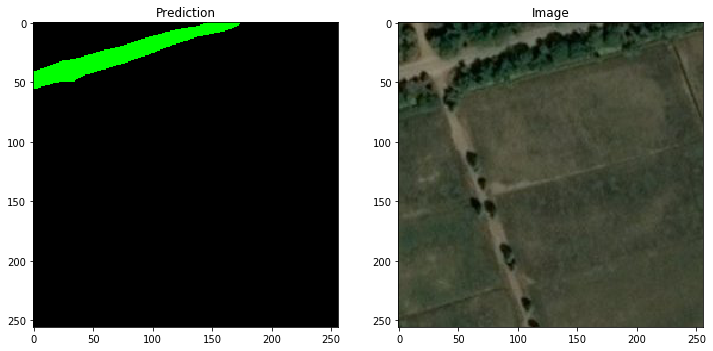

In [42]:
i = 0
for file in data:
    filename = target + '/' + file
    #print filename
    img_ = loadImage(filename)
    img = np.expand_dims(np.float32(img_), axis=0)/255.0
    
    gt_filename = target_labels + '/' + file
    #print gt_filename
    gt_ = loadImage(gt_filename)
    gt = reverse_one_hot(one_hot_to_it(gt_, label_values))
    output_image = sess.run(network, feed_dict={input:img, keep_prob:1.0})
    output_image = np.array(output_image[0, :, :, :])
    output_image = helpers.reverse_one_hot(output_image)
    out_vis_image = helpers.colour_code_segmentation(output_image, label_values)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))

    ax1.imshow(out_vis_image)
    ax1.set_title('Prediction')
    #plt.show() 
    #fig, ax = plt.subplots(figsize=(7, 7))
    #ax2.imshow(gt_)
    #ax2.set_title('GT')
    #plt.show()
    #fig, ax = plt.subplots(figsize=(7, 7))
    ax2.imshow(img_)
    ax2.set_title('Image')
    #plt.show()
    
    
    
    
    i += 1
    if i == 100:
        break
    #cv2.imwrite("%s_%s_pred.png"%(output, name), cv2.cvtColor(np.uint8(out_vis_image), cv2.COLOR_RGB2BGR))
    #cv2.imwrite("%s_%s_img.png"%(output, name), cv2.cvtColor(np.uint8(out_vis_image), cv2.COLOR_RGB2BGR))
    
    

In [63]:
def url_to_image(url):
    # download the image, convert it to a NumPy array, and then read
    # it into OpenCV format
    #import urllib
    #resp = urllib.urlopen(url)
    image = io.imread(url)
    w, h, ch = image.shape
    #image = np.asarray(bytearray(resp.read()), dtype="uint8")
    #image = cv2.imdecode(image, cv2.IMREAD_COLOR)
    image = cv2.resize(image, (256, 256))
    print(image.shape)
    image = np.reshape(image, (1, 256, 256, 3))
    cv2.imwrite('op.png', image)
    return image, w, h, ch

def demo_prediction(image):
    from skimage import io
    from IPython.display import Image
    print('Image')
    display(Image(url=image, width=512, height=512))
    img, w, h, ch = url_to_image(image)
    
    cv2.imwrite('testY.png', np.reshape(img, (256, 256, 3)))
    output_image = sess.run(network, feed_dict={input:img, keep_prob:1.0})
    
    output_image = np.array(output_image[0, :, :, :])
    output_image = helpers.reverse_one_hot(output_image)
    out_vis_image = helpers.colour_code_segmentation(output_image, label_values)
    fig, ax = plt.subplots(figsize=(12, 8))

    ax.imshow(out_vis_image)
    ax.set_title('Prediction')
    

Image


(256, 256, 3)


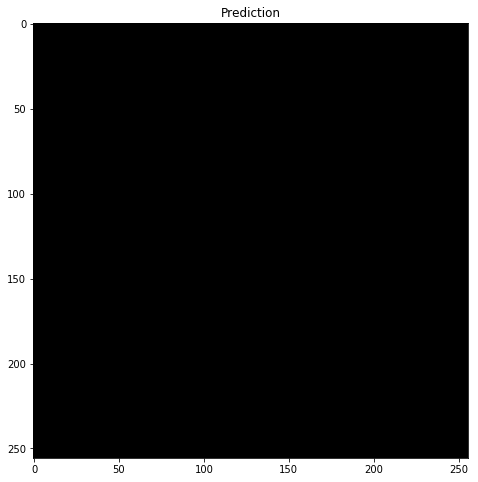

In [64]:
image = 'https://previews.123rf.com/images/svedoliver/svedoliver1302/svedoliver130200633/18044573-green-fields-with-road-aerial-view.jpg'
demo_prediction(image=image)

In [35]:
from skimage import io
_image = io.imread(image)

In [39]:
cv2.imwrite('io.png',_image)

True